<h1><center>Data Glacier Internship</center></h1>
<h2><center>Final Project Notebook</center></h2>



### Group: Single Member Group
### Name: Hassan Faheem 
### Batch: LISUM06
### Email: Hassan_hsn9@hotmail.com
### Country: UAE
### University: Heriot-Watt University
### Specialization: Data Science
### Topic: Healthcare: Persistency of a Drug




## Problem Description
<p align="justify/left/right/center">The problem given here is that the Pharmaceutical Company, ABC is in need to understand the persistency of drug as per the physician prescription. The company ABC has thus approached a company that specializes in Analytics, to get this process of identification to be automated. The company has assigned the case to the relevant member to figure out the solution for the automation of persistency of drug for the company ABC.</p>


In [1]:
# Importing all the necessary libraries 

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from scipy import stats
import warnings

%matplotlib inline
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
warnings.filterwarnings('ignore')

In [2]:
# Importing the necessary libraries for Classifier training, Testing & Evaluation

from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report, roc_curve, confusion_matrix
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler
from sklearn.utils import resample

from sklearn.linear_model import LogisticRegression, RidgeClassifier, SGDClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, AdaBoostClassifier, ExtraTreesClassifier, GradientBoostingClassifier, StackingClassifier, VotingClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import make_pipeline

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.layers import Dropout
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import BatchNormalization

import pickle


### Reading in Data & Exploration 

In [3]:
xls = pd.ExcelFile('Healthcare_dataset.xlsx')
df = pd.read_excel(xls, "Dataset")

In [4]:
df.head()

,Ptid,Persistency_Flag,Gender,Race,Ethnicity,Region,Age_Bucket,Ntm_Speciality,Ntm_Specialist_Flag,Ntm_Speciality_Bucket,Gluco_Record_Prior_Ntm,Gluco_Record_During_Rx,Dexa_Freq_During_Rx,Dexa_During_Rx,Frag_Frac_Prior_Ntm,Frag_Frac_During_Rx,Risk_Segment_Prior_Ntm,Tscore_Bucket_Prior_Ntm,Risk_Segment_During_Rx,Tscore_Bucket_During_Rx,Change_T_Score,Change_Risk_Segment,Adherent_Flag,Idn_Indicator,Injectable_Experience_During_Rx,Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,Comorb_Encounter_For_Immunization,"Comorb_Encntr_For_General_Exam_W_O_Complaint,_Susp_Or_Reprtd_Dx",Comorb_Vitamin_D_Deficiency,Comorb_Other_Joint_Disorder_Not_Elsewhere_Classified,Comorb_Encntr_For_Oth_Sp_Exam_W_O_Complaint_Suspected_Or_Reprtd_Dx,Comorb_Long_Term_Current_Drug_Therapy,Comorb_Dorsalgia,Comorb_Personal_History_Of_Other_Diseases_And_Conditions,Comorb_Other_Disorders_Of_Bone_Density_And_Structure,Comorb_Disorders_of_lipoprotein_metabolism_and_other_lipidemias,Comorb_Osteoporosis_without_current_pathological_fracture,Comorb_Personal_history_of_malignant_neoplasm,Comorb_Gastro_esophageal_reflux_disease,Concom_Cholesterol_And_Triglyceride_Regulating_Preparations,Concom_Narcotics,Concom_Systemic_Corticosteroids_Plain,Concom_Anti_Depressants_And_Mood_Stabilisers,Concom_Fluoroquinolones,Concom_Cephalosporins,Concom_Macrolides_And_Similar_Types,Concom_Broad_Spectrum_Penicillins,Concom_Anaesthetics_General,Concom_Viral_Vaccines,Risk_Type_1_Insulin_Dependent_Diabetes,Risk_Osteogenesis_Imperfecta,Risk_Rheumatoid_Arthritis,Risk_Untreated_Chronic_Hyperthyroidism,Risk_Untreated_Chronic_Hypogonadism,Risk_Untreated_Early_Menopause,Risk_Patient_Parent_Fractured_Their_Hip,Risk_Smoking_Tobacco,Risk_Chronic_Malnutrition_Or_Malabsorption,Risk_Chronic_Liver_Disease,Risk_Family_History_Of_Osteoporosis,Risk_Low_Calcium_Intake,Risk_Vitamin_D_Insufficiency,Risk_Poor_Health_Frailty,Risk_Excessive_Thinness,Risk_Hysterectomy_Oophorectomy,Risk_Estrogen_Deficiency,Risk_Immobilization,Risk_Recurring_Falls,Count_Of_Risks
0,P1,Persistent,Male,Caucasian,Not Hispanic,West,>75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,N,N,0,N,N,N,VLR_LR,>-2.5,VLR_LR,<=-2.5,No change,Unknown,Adherent,N,Y,N,Y,Y,N,N,Y,N,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,0
1,P2,Non-Persistent,Male,Asian,Not Hispanic,West,55-65,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,N,N,0,N,N,N,VLR_LR,>-2.5,Unknown,Unknown,Unknown,Unknown,Adherent,N,Y,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,0
2,P3,Non-Persistent,Female,Other/Unknown,Hispanic,Midwest,65-75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,N,N,0,N,N,N,HR_VHR,<=-2.5,HR_VHR,<=-2.5,No change,No change,Adherent,N,Y,Y,N,Y,N,N,N,N,N,N,N,N,N,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,Y,N,N,N,N,Y,N,N,N,N,N,N,N,2
3,P4,Non-Persistent,Female,Caucasian,Not Hispanic,Midwest,>75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,N,Y,0,N,N,N,HR_VHR,>-2.5,HR_VHR,<=-2.5,No change,No change,Adherent,N,Y,N,Y,Y,N,Y,N,N,Y,N,N,Y,N,N,Y,N,Y,Y,N,N,N,N,N,N,Y,N,N,N,N,N,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,1
4,P5,Non-Persistent,Female,Caucasian,Not Hispanic,Midwest,>75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,Y,Y,0,N,N,N,HR_VHR,<=-2.5,Unknown,Unknown,Unknown,Unknown,Adherent,N,Y,Y,Y,Y,N,N,N,N,Y,Y,N,N,N,N,N,N,Y,Y,Y,N,N,N,N,N,N,N,N,N,N,N,N,N,Y,N,N,N,N,N,N,N,N,N,N,N,1


In [5]:
df.dtypes

Ptid                                                                  object
Persistency_Flag                                                      object
Gender                                                                object
Race                                                                  object
Ethnicity                                                             object
Region                                                                object
Age_Bucket                                                            object
Ntm_Speciality                                                        object
Ntm_Specialist_Flag                                                   object
Ntm_Speciality_Bucket                                                 object
Gluco_Record_Prior_Ntm                                                object
Gluco_Record_During_Rx                                                object
Dexa_Freq_During_Rx                                                    int64

In [6]:
df.shape

(3424, 69)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3424 entries, 0 to 3423
Data columns (total 69 columns):
 #   Column                                                              Non-Null Count  Dtype 
---  ------                                                              --------------  ----- 
 0   Ptid                                                                3424 non-null   object
 1   Persistency_Flag                                                    3424 non-null   object
 2   Gender                                                              3424 non-null   object
 3   Race                                                                3424 non-null   object
 4   Ethnicity                                                           3424 non-null   object
 5   Region                                                              3424 non-null   object
 6   Age_Bucket                                                          3424 non-null   object
 7   Ntm_Speciality          

### Data Understanding
The Healthcare Dataset provided has 69 columns and 3424 number of observations. The target variable is Persistency_Flag. This variable is of Boolean data type with values that are either True or False. After understanding and analyzing the data, it’s been found that there are few columns that are of numerical data type. Most of the columns are of either Boolean data type or String data type. 

### Exploratory Data Analysis

In [8]:
#Checking for missing values

df.isnull().sum()

Ptid                                                                  0
Persistency_Flag                                                      0
Gender                                                                0
Race                                                                  0
Ethnicity                                                             0
Region                                                                0
Age_Bucket                                                            0
Ntm_Speciality                                                        0
Ntm_Specialist_Flag                                                   0
Ntm_Speciality_Bucket                                                 0
Gluco_Record_Prior_Ntm                                                0
Gluco_Record_During_Rx                                                0
Dexa_Freq_During_Rx                                                   0
Dexa_During_Rx                                                  

In [9]:
#Checking & Analysing Outliers

fig = px.histogram(df, x="Dexa_Freq_During_Rx",
                   marginal="box", # or violin, rug
                   hover_data=df.columns)
fig.show()

In [10]:
fig = px.histogram(df, x="Count_Of_Risks",
                   marginal="box", # or violin, rug
                   hover_data=df.columns)
fig.show()

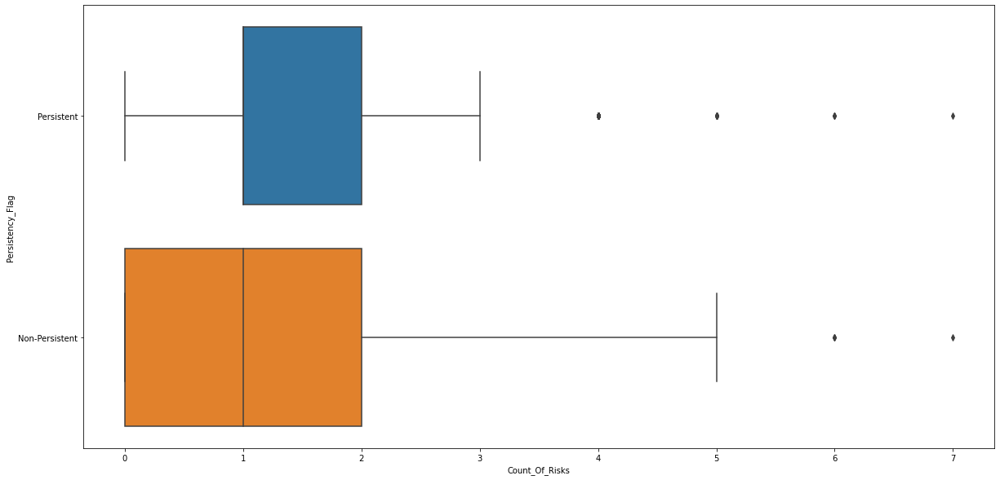

In [11]:
plt.figure(figsize=(20,10))
var ="Count_Of_Risks"
sns.boxplot(x=var,y ="Persistency_Flag",data=df)

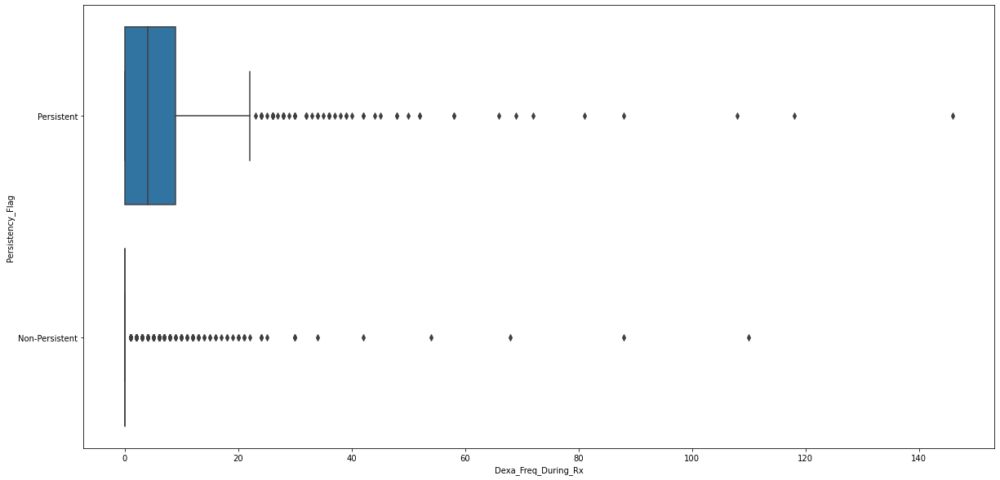

In [12]:
plt.figure(figsize=(20,10))
var ="Dexa_Freq_During_Rx"
sns.boxplot(x=var,y ="Persistency_Flag",data=df)

In [13]:
# Results show that the data is positively skewed & has few outliers due to low count of kurtosis

print("Count of risks skewness: ",df["Count_Of_Risks"].skew())
print("Count of risks Kurtosis: ",df["Count_Of_Risks"].kurt())

Count of risks skewness:  0.8797905232898707
Count of risks Kurtosis:  0.9004859968892842


In [14]:
# Results show that the data is very positively skewed & also has a lot of outliers due to high kurtosis

print("dexa_freq_during_rx skewness: ",df["Dexa_Freq_During_Rx"].skew())
print("dexa_freq_during_rx Kurtosis: ",df["Dexa_Freq_During_Rx"].kurt())

dexa_freq_during_rx skewness:  6.8087302112992285
dexa_freq_during_rx Kurtosis:  74.75837754795428


In [15]:
dexa_scaled = StandardScaler().fit_transform(df['Dexa_Freq_During_Rx'][:,np.newaxis]);
low_range = dexa_scaled[dexa_scaled[:,0].argsort()][:10]
high_range= dexa_scaled[dexa_scaled[:,0].argsort()][-10:]


print('outer range (low) of the distribution:')
print(low_range)
print('\nouter range (high) of the distribution:')
print(high_range)

outer range (low) of the distribution:
[[-0.3707352]
 [-0.3707352]
 [-0.3707352]
 [-0.3707352]
 [-0.3707352]
 [-0.3707352]
 [-0.3707352]
 [-0.3707352]
 [-0.3707352]
 [-0.3707352]]

outer range (high) of the distribution:
[[ 7.98784109]
 [ 8.11076133]
 [ 8.47952205]
 [ 9.58580421]
 [10.44624589]
 [10.44624589]
 [12.90465068]
 [13.15049116]
 [14.13385307]
 [17.57561978]]


In [16]:
scaler = RobustScaler()
df['Dexa_Freq_During_Rx'] = scaler.fit_transform(df['Dexa_Freq_During_Rx'].values.reshape(-1,1))

In [17]:
scaler = RobustScaler()
df['Count_Of_Risks'] = scaler.fit_transform(df['Count_Of_Risks'].values.reshape(-1,1))

In [18]:
# Calculating IQR
Q1 = np.percentile(df['Dexa_Freq_During_Rx'], 25, interpolation = 'midpoint') 
Q3 = np.percentile(df['Dexa_Freq_During_Rx'], 75, interpolation = 'midpoint') 
IQR = Q3 - Q1 
  
print("Old Shape: ", df.shape) 
  
# Calculating Upper bound
upper = np.where(df['Dexa_Freq_During_Rx'] >= (Q3+1.5*IQR))
# Calculating Lower bound
lower = np.where(df['Dexa_Freq_During_Rx'] <= (Q1-1.5*IQR))
  
print("lower",lower[0])
print("Upper",upper[0])

Old Shape:  (3424, 69)
lower []
Upper [  32   33   62   65   89  101  110  116  164  180  186  194  198  201
  217  241  246  256  264  282  292  303  327  340  349  358  368  369
  373  378  382  390  415  417  426  433  448  457  462  464  480  495
  496  497  505  514  517  541  545  549  563  575  588  589  592  599
  603  605  613  640  646  651  653  656  657  678  684  688  700  705
  710  711  726  728  729  730  759  760  764  765  785  786  804  814
  823  834  847  849  864  870  873  885  909  915  925  926  930  937
  946  978  982  991  994 1006 1008 1016 1042 1061 1073 1074 1076 1113
 1118 1119 1128 1134 1141 1148 1151 1196 1240 1265 1267 1270 1272 1273
 1280 1283 1286 1291 1315 1359 1360 1363 1365 1370 1372 1396 1398 1404
 1448 1474 1513 1524 1533 1539 1546 1550 1554 1555 1564 1566 1570 1576
 1599 1628 1641 1642 1647 1654 1662 1671 1691 1703 1724 1732 1734 1746
 1752 1773 1782 1783 1788 1793 1803 1815 1826 1833 1834 1836 1838 1848
 1852 1854 1870 1876 1895 1901 1904 190

In [19]:
# Removing Outliers 
df.drop(upper[0], inplace = True)
df.drop(lower[0], inplace = True)

print("New Shape: ", df.shape)

df = df.reset_index(drop=True)

New Shape:  (2964, 69)


In [20]:
# Calculating IQR
Q1 = np.percentile(df['Count_Of_Risks'], 25, interpolation = 'midpoint') 
Q3 = np.percentile(df['Count_Of_Risks'], 75, interpolation = 'midpoint') 
IQR = Q3 - Q1 
  
print("Old Shape: ", df.shape) 
  
# Calculating Upper bound
upper = np.where(df['Count_Of_Risks'] >= (Q3+1.5*IQR))
# Calculating Lower bound
lower = np.where(df['Count_Of_Risks'] <= (Q1-1.5*IQR))
  
print("lower",lower[0])
print("Upper",upper[0])

Old Shape:  (2964, 69)
lower []
Upper [ 281  318  327  507  655  665  678  705  733  952 1001 1126 1590 1624
 1836 2227 2234 2450 2611 2702 2755 2888]


In [21]:
# Removing Outliers
df.drop(upper[0], inplace = True)
df.drop(lower[0], inplace = True)

print("New Shape: ", df.shape) 

df = df.reset_index(drop=True)

New Shape:  (2942, 69)


In [22]:
# Removing ID column
# The column of “Ptid” which refers to Patient ID has no value in terms of model training and 
# thus will be removed from the dataset. 

df = df.drop(['Ptid'], axis=1)

In [23]:
mapper = {'N': 0, 'Y':1}
df = df.replace(mapper)

In [24]:
# Replacing the values with 0 & 1

df['Persistency_Flag'] = df['Persistency_Flag'].replace(['Non-Persistent', 'Persistent'],[0, 1])
df.head()

,Persistency_Flag,Gender,Race,Ethnicity,Region,Age_Bucket,Ntm_Speciality,Ntm_Specialist_Flag,Ntm_Speciality_Bucket,Gluco_Record_Prior_Ntm,Gluco_Record_During_Rx,Dexa_Freq_During_Rx,Dexa_During_Rx,Frag_Frac_Prior_Ntm,Frag_Frac_During_Rx,Risk_Segment_Prior_Ntm,Tscore_Bucket_Prior_Ntm,Risk_Segment_During_Rx,Tscore_Bucket_During_Rx,Change_T_Score,Change_Risk_Segment,Adherent_Flag,Idn_Indicator,Injectable_Experience_During_Rx,Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,Comorb_Encounter_For_Immunization,"Comorb_Encntr_For_General_Exam_W_O_Complaint,_Susp_Or_Reprtd_Dx",Comorb_Vitamin_D_Deficiency,Comorb_Other_Joint_Disorder_Not_Elsewhere_Classified,Comorb_Encntr_For_Oth_Sp_Exam_W_O_Complaint_Suspected_Or_Reprtd_Dx,Comorb_Long_Term_Current_Drug_Therapy,Comorb_Dorsalgia,Comorb_Personal_History_Of_Other_Diseases_And_Conditions,Comorb_Other_Disorders_Of_Bone_Density_And_Structure,Comorb_Disorders_of_lipoprotein_metabolism_and_other_lipidemias,Comorb_Osteoporosis_without_current_pathological_fracture,Comorb_Personal_history_of_malignant_neoplasm,Comorb_Gastro_esophageal_reflux_disease,Concom_Cholesterol_And_Triglyceride_Regulating_Preparations,Concom_Narcotics,Concom_Systemic_Corticosteroids_Plain,Concom_Anti_Depressants_And_Mood_Stabilisers,Concom_Fluoroquinolones,Concom_Cephalosporins,Concom_Macrolides_And_Similar_Types,Concom_Broad_Spectrum_Penicillins,Concom_Anaesthetics_General,Concom_Viral_Vaccines,Risk_Type_1_Insulin_Dependent_Diabetes,Risk_Osteogenesis_Imperfecta,Risk_Rheumatoid_Arthritis,Risk_Untreated_Chronic_Hyperthyroidism,Risk_Untreated_Chronic_Hypogonadism,Risk_Untreated_Early_Menopause,Risk_Patient_Parent_Fractured_Their_Hip,Risk_Smoking_Tobacco,Risk_Chronic_Malnutrition_Or_Malabsorption,Risk_Chronic_Liver_Disease,Risk_Family_History_Of_Osteoporosis,Risk_Low_Calcium_Intake,Risk_Vitamin_D_Insufficiency,Risk_Poor_Health_Frailty,Risk_Excessive_Thinness,Risk_Hysterectomy_Oophorectomy,Risk_Estrogen_Deficiency,Risk_Immobilization,Risk_Recurring_Falls,Count_Of_Risks
0,1,Male,Caucasian,Not Hispanic,West,>75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,0,0,0.0,0,0,0,VLR_LR,>-2.5,VLR_LR,<=-2.5,No change,Unknown,Adherent,0,1,0,1,1,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-0.5
1,0,Male,Asian,Not Hispanic,West,55-65,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,0,0,0.0,0,0,0,VLR_LR,>-2.5,Unknown,Unknown,Unknown,Unknown,Adherent,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,-0.5
2,0,Female,Other/Unknown,Hispanic,Midwest,65-75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,0,0,0.0,0,0,0,HR_VHR,<=-2.5,HR_VHR,<=-2.5,No change,No change,Adherent,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0.5
3,0,Female,Caucasian,Not Hispanic,Midwest,>75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,0,1,0.0,0,0,0,HR_VHR,>-2.5,HR_VHR,<=-2.5,No change,No change,Adherent,0,1,0,1,1,0,1,0,0,1,0,0,1,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0.0
4,0,Female,Caucasian,Not Hispanic,Midwest,>75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,1,1,0.0,0,0,0,HR_VHR,<=-2.5,Unknown,Unknown,Unknown,Unknown,Adherent,0,1,1,1,1,0,0,0,0,1,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0.0


In [25]:
# Analyzing data after the Transformation

np.abs(df.corr()).sort_values(by=['Persistency_Flag'], ascending=False)

,Persistency_Flag,Gluco_Record_Prior_Ntm,Gluco_Record_During_Rx,Dexa_Freq_During_Rx,Dexa_During_Rx,Frag_Frac_Prior_Ntm,Frag_Frac_During_Rx,Idn_Indicator,Injectable_Experience_During_Rx,Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,Comorb_Encounter_For_Immunization,"Comorb_Encntr_For_General_Exam_W_O_Complaint,_Susp_Or_Reprtd_Dx",Comorb_Vitamin_D_Deficiency,Comorb_Other_Joint_Disorder_Not_Elsewhere_Classified,Comorb_Encntr_For_Oth_Sp_Exam_W_O_Complaint_Suspected_Or_Reprtd_Dx,Comorb_Long_Term_Current_Drug_Therapy,Comorb_Dorsalgia,Comorb_Personal_History_Of_Other_Diseases_And_Conditions,Comorb_Other_Disorders_Of_Bone_Density_And_Structure,Comorb_Disorders_of_lipoprotein_metabolism_and_other_lipidemias,Comorb_Osteoporosis_without_current_pathological_fracture,Comorb_Personal_history_of_malignant_neoplasm,Comorb_Gastro_esophageal_reflux_disease,Concom_Cholesterol_And_Triglyceride_Regulating_Preparations,Concom_Narcotics,Concom_Systemic_Corticosteroids_Plain,Concom_Anti_Depressants_And_Mood_Stabilisers,Concom_Fluoroquinolones,Concom_Cephalosporins,Concom_Macrolides_And_Similar_Types,Concom_Broad_Spectrum_Penicillins,Concom_Anaesthetics_General,Concom_Viral_Vaccines,Risk_Type_1_Insulin_Dependent_Diabetes,Risk_Osteogenesis_Imperfecta,Risk_Rheumatoid_Arthritis,Risk_Untreated_Chronic_Hyperthyroidism,Risk_Untreated_Chronic_Hypogonadism,Risk_Untreated_Early_Menopause,Risk_Patient_Parent_Fractured_Their_Hip,Risk_Smoking_Tobacco,Risk_Chronic_Malnutrition_Or_Malabsorption,Risk_Chronic_Liver_Disease,Risk_Family_History_Of_Osteoporosis,Risk_Low_Calcium_Intake,Risk_Vitamin_D_Insufficiency,Risk_Poor_Health_Frailty,Risk_Excessive_Thinness,Risk_Hysterectomy_Oophorectomy,Risk_Estrogen_Deficiency,Risk_Immobilization,Risk_Recurring_Falls,Count_Of_Risks
Persistency_Flag,1.000000,0.003027,0.212778,0.414876,0.374966,0.005521,0.102944,0.125887,0.097495,0.268339,0.268305,0.257895,0.151592,0.215937,0.164096,0.342776,0.179925,0.189565,0.227003,0.147411,0.132641,0.157273,0.207985,0.125322,0.188391,0.249048,0.111728,0.181213,0.217821,0.192350,0.186610,0.220619,0.227004,0.007144,0.002022,0.059501,0.017246,0.045216,0.004193,0.015073,0.115573,0.031632,0.029426,0.016878,0.013116,0.069520,0.055891,0.023628,0.016192,0.023250,0.042316,0.020356,0.071565
Dexa_Freq_During_Rx,0.414876,0.004579,0.113110,1.000000,0.937887,0.026026,0.074350,0.069223,0.047364,0.189816,0.139956,0.147761,0.112020,0.131364,0.099428,0.227321,0.100791,0.094119,0.241814,0.101263,0.175626,0.105473,0.111739,0.072511,0.134652,0.132662,0.068515,0.109254,0.108692,0.102847,0.101176,0.172603,0.101285,0.018578,0.013033,0.010902,0.010639,0.016361,0.015623,0.001692,0.067436,0.027944,0.020674,0.013810,0.000311,0.062477,0.013199,0.009656,0.007561,0.000155,0.023328,0.012977,0.068723
Dexa_During_Rx,0.374966,0.007609,0.104582,0.937887,1.000000,0.026049,0.069782,0.062444,0.044403,0.175978,0.117186,0.141213,0.092953,0.126303,0.094991,0.200062,0.088536,0.083433,0.234226,0.091502,0.181794,0.098819,0.102311,0.070182,0.130274,0.120977,0.073281,0.102795,0.102058,0.086760,0.100311,0.160387,0.085717,0.020031,0.013896,0.005832,0.011344,0.011717,0.019036,0.003588,0.067105,0.027883,0.023942,0.017250,0.010763,0.053698,0.022940,0.004589,0.016344,0.009564,0.013253,0.022306,0.066772
Comorb_Long_Term_Current_Drug_Therapy,0.342776,0.095477,0.198705,0.227321,0.200062,0.047262,0.116206,0.103854,0.094747,0.132439,0.196069,0.113580,0.104871,0.198705,0.114082,1.000000,0.206443,0.228391,0.218237,0.136753,0.154413,0.161799,0.231900,0.152348,0.276913,0.232933,0.094536,0.158418,0.230645,0.149318,0.143598,0.261722,0.213756,0.111473,0.009668,0.156696,0.013450,0.011753,0.031591,0.012494,0.130473,0.054439,0.000717,0.028850,0.027036,0.079034,0.036156,0.012803,0.023476,0.013456,0.019909,0.052037,0.156891
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.268339,0.023529,0.077097,0.189816,0.175978,0.025982,0.011839,0.061082,0.056999,1.000000,0.187835,0.261385,0.062198,0.105490,0.250130,0.132439,0.109094,0.112999,0.132817,0.144459

### Analyzing Data after EDA

In [26]:
#distribution of categorical features

df.describe(include=['O'])

,Gender,Race,Ethnicity,Region,Age_Bucket,Ntm_Speciality,Ntm_Specialist_Flag,Ntm_Speciality_Bucket,Risk_Segment_Prior_Ntm,Tscore_Bucket_Prior_Ntm,Risk_Segment_During_Rx,Tscore_Bucket_During_Rx,Change_T_Score,Change_Risk_Segment,Adherent_Flag
count,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942,2942
unique,2,4,3,5,4,35,2,3,2,2,3,3,4,4,2
top,Female,Caucasian,Not Hispanic,Midwest,>75,GENERAL PRACTITIONER,Others,OB/GYN/Others/PCP/Unknown,VLR_LR,>-2.5,Unknown,Unknown,No change,Unknown,Adherent
freq,2769,2701,2784,1210,1262,1345,1774,1855,1676,1690,1362,1362,1387,1969,2807


In [27]:
df.groupby(['Persistency_Flag']).mean().T

Persistency_Flag,0,1
Gluco_Record_Prior_Ntm,0.237421,0.240223
Gluco_Record_During_Rx,0.189546,0.389944
Dexa_Freq_During_Rx,0.085491,0.662570
Dexa_During_Rx,0.068393,0.366480
Frag_Frac_Prior_Ntm,0.152907,0.148603
Frag_Frac_During_Rx,0.090376,0.160894
Idn_Indicator,0.711285,0.830168
Injectable_Experience_During_Rx,0.868588,0.935196
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.313141,0.598883
Comorb_Encounter_For_Immunization,0.311187,0.596648


In [28]:
df.groupby(['Gender']).mean().T

Gender,Female,Male
Persistency_Flag,0.300831,0.358382
Gluco_Record_Prior_Ntm,0.235464,0.283237
Gluco_Record_During_Rx,0.249187,0.271676
Dexa_Freq_During_Rx,0.263874,0.215800
Dexa_During_Rx,0.160708,0.132948
Frag_Frac_Prior_Ntm,0.150235,0.173410
Frag_Frac_During_Rx,0.108704,0.161850
Idn_Indicator,0.750090,0.705202
Injectable_Experience_During_Rx,0.888769,0.890173
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.412062,0.208092


In [29]:
df.groupby(['Race']).mean()

,Persistency_Flag,Gluco_Record_Prior_Ntm,Gluco_Record_During_Rx,Dexa_Freq_During_Rx,Dexa_During_Rx,Frag_Frac_Prior_Ntm,Frag_Frac_During_Rx,Idn_Indicator,Injectable_Experience_During_Rx,Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,Comorb_Encounter_For_Immunization,"Comorb_Encntr_For_General_Exam_W_O_Complaint,_Susp_Or_Reprtd_Dx",Comorb_Vitamin_D_Deficiency,Comorb_Other_Joint_Disorder_Not_Elsewhere_Classified,Comorb_Encntr_For_Oth_Sp_Exam_W_O_Complaint_Suspected_Or_Reprtd_Dx,Comorb_Long_Term_Current_Drug_Therapy,Comorb_Dorsalgia,Comorb_Personal_History_Of_Other_Diseases_And_Conditions,Comorb_Other_Disorders_Of_Bone_Density_And_Structure,Comorb_Disorders_of_lipoprotein_metabolism_and_other_lipidemias,Comorb_Osteoporosis_without_current_pathological_fracture,Comorb_Personal_history_of_malignant_neoplasm,Comorb_Gastro_esophageal_reflux_disease,Concom_Cholesterol_And_Triglyceride_Regulating_Preparations,Concom_Narcotics,Concom_Systemic_Corticosteroids_Plain,Concom_Anti_Depressants_And_Mood_Stabilisers,Concom_Fluoroquinolones,Concom_Cephalosporins,Concom_Macrolides_And_Similar_Types,Concom_Broad_Spectrum_Penicillins,Concom_Anaesthetics_General,Concom_Viral_Vaccines,Risk_Type_1_Insulin_Dependent_Diabetes,Risk_Osteogenesis_Imperfecta,Risk_Rheumatoid_Arthritis,Risk_Untreated_Chronic_Hyperthyroidism,Risk_Untreated_Chronic_Hypogonadism,Risk_Untreated_Early_Menopause,Risk_Patient_Parent_Fractured_Their_Hip,Risk_Smoking_Tobacco,Risk_Chronic_Malnutrition_Or_Malabsorption,Risk_Chronic_Liver_Disease,Risk_Family_History_Of_Osteoporosis,Risk_Low_Calcium_Intake,Risk_Vitamin_D_Insufficiency,Risk_Poor_Health_Frailty,Risk_Excessive_Thinness,Risk_Hysterectomy_Oophorectomy,Risk_Estrogen_Deficiency,Risk_Immobilization,Risk_Recurring_Falls,Count_Of_Risks
Race,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
African American,0.304348,0.184783,0.250000,0.246377,0.163043,0.086957,0.076087,0.858696,0.923913,0.467391,0.413043,0.326087,0.456522,0.293478,0.239130,0.206522,0.173913,0.152174,0.141304,0.434783,0.282609,0.097826,0.130435,0.304348,0.369565,0.293478,0.163043,0.141304,0.119565,0.141304,0.076087,0.152174,0.130435,0.076087,0.00000,0.065217,0.01087,0.021739,0.021739,0.021739,0.228261,0.130435,0.000000,0.065217,0.010870,0.597826,0.043478,0.021739,0.01087,0.000000,0.000000,0.010870,0.168478
Asian,0.376812,0.043478,0.086957,0.135266,0.086957,0.260870,0.188406,0.550725,0.884058,0.391304,0.565217,0.492754,0.289855,0.347826,0.246377,0.173913,0.202899,0.202899,0.159420,0.521739,0.231884,0.188406,0.202899,0.289855,0.144928,0.086957,0.159420,0.086957,0.072464,0.057971,0.086957,0.057971,0.043478,0.057971,0.00000,0.014493,0.00000,0.043478,0.014493,0.043478,0.144928,0.086957,0.000000,0.072464,0.000000,0.492754,0.014493,0.028986,0.00000,0.000000,0.000000,0.028986,0.021739
Caucasian,0.303961,0.245465,0.256572,0.266445,0.161792,0.149204,0.111440,0.750833,0.889670,0.400222,0.393558,0.355794,0.295076,0.266568,0.193632,0.211773,0.202147,0.172158,0.132173,0.497964,0.252129,0.175861,0.165494,0.339504,0.347649,0.278045,0.281007,0.175861,0.164754,0.150315,0.119215,0.133654,0.094039,0.038134,0.00074,0.035172,0.00037,0.032210,0.002592,0.071085,0.185857,0.129582,0.004813,0.101814,0.012218,0.464272,0.054424,0.019993,0.01629,0.003332,0.004443,0.019252,0.098297
Other/Unknown,0.250000,0.225000,0.187500,0.204167,0.125000,0.212500,0.100000,0.675000,0.825000,0.325000,0.387500,0.325000,0.350000,0.312500,0.162500,0.187500,0.175000,0.137500,0.087500,0.450000,0.175000,0.137500,0.150000,0.300000,0.250000,0.187500,0.162500,0.200000,0.112500,0.062500,0.087500,0.050000,0.100000,0.050000,0.01250,0.075000,0.00000,0.012500,0.012500,0.050000,0.237500,0.112500,0.012500,0.075000,0.025000,0.512500,0.025000,0.037500,0.00000,0.000000,0.000000,0.000000,0.125000


In [30]:
df.groupby(['Ethnicity']).mean().T

Ethnicity,Hispanic,Not Hispanic,Unknown
Persistency_Flag,0.234568,0.308190,0.233766
Gluco_Record_Prior_Ntm,0.172840,0.239943,0.246753
Gluco_Record_During_Rx,0.271605,0.251078,0.207792
Dexa_Freq_During_Rx,0.279835,0.260417,0.264069
Dexa_During_Rx,0.160494,0.159124,0.155844
Frag_Frac_Prior_Ntm,0.172840,0.152299,0.103896
Frag_Frac_During_Rx,0.111111,0.112428,0.090909
Idn_Indicator,0.753086,0.751796,0.584416
Injectable_Experience_During_Rx,0.901235,0.891164,0.792208
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.382716,0.404813,0.246753


In [31]:
df.groupby(['Age_Bucket']).mean().T

Age_Bucket,55-65,65-75,<55,>75
Persistency_Flag,0.271704,0.315789,0.328767,0.309033
Gluco_Record_Prior_Ntm,0.197749,0.253289,0.219178,0.249604
Gluco_Record_During_Rx,0.205788,0.275219,0.253425,0.254358
Dexa_Freq_During_Rx,0.242229,0.297880,0.273973,0.242208
Dexa_During_Rx,0.154341,0.176535,0.178082,0.146593
Frag_Frac_Prior_Ntm,0.098071,0.127193,0.082192,0.203645
Frag_Frac_During_Rx,0.075563,0.103070,0.068493,0.141046
Idn_Indicator,0.718650,0.752193,0.746575,0.758320
Injectable_Experience_During_Rx,0.893891,0.880482,0.904110,0.890650
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.435691,0.498904,0.424658,0.308241


In [32]:
df.groupby(['Ntm_Speciality']).mean().T

Ntm_Speciality,CARDIOLOGY,CLINICAL NURSE SPECIALIST,EMERGENCY MEDICINE,ENDOCRINOLOGY,GASTROENTEROLOGY,GENERAL PRACTITIONER,GERIATRIC MEDICINE,HEMATOLOGY & ONCOLOGY,HOSPICE AND PALLIATIVE MEDICINE,HOSPITAL MEDICINE,NEPHROLOGY,NUCLEAR MEDICINE,OBSTETRICS & OBSTETRICS & GYNECOLOGY & OBSTETRICS & GYNECOLOGY,OBSTETRICS AND GYNECOLOGY,OCCUPATIONAL MEDICINE,ONCOLOGY,OPHTHALMOLOGY,ORTHOPEDIC SURGERY,ORTHOPEDICS,OTOLARYNGOLOGY,PAIN MEDICINE,PATHOLOGY,PEDIATRICS,PHYSICAL MEDICINE AND REHABILITATION,PLASTIC SURGERY,PODIATRY,PSYCHIATRY AND NEUROLOGY,PULMONARY MEDICINE,RADIOLOGY,RHEUMATOLOGY,SURGERY AND SURGICAL SPECIALTIES,TRANSPLANT SURGERY,UROLOGY,Unknown,VASCULAR SURGERY
Persistency_Flag,0.000000,0.0,0.0,0.383978,0.0,0.255762,0.00,0.333333,0.50,0.0,0.0,1.0,0.0,0.312500,1.0,0.620321,0.0,0.200000,0.00,0.153846,0.000000,0.615385,0.444444,0.000000,0.5,0.0,0.333333,0.142857,1.0,0.296660,0.2500,0.0,0.275862,0.279152,0.5
Gluco_Record_Prior_Ntm,0.238095,0.0,0.0,0.207182,0.5,0.212639,0.00,0.250000,1.00,1.0,0.0,1.0,0.0,0.112500,0.0,0.235294,0.0,0.400000,0.50,0.000000,0.000000,0.076923,0.000000,0.181818,0.0,0.0,0.333333,0.142857,0.0,0.369352,0.6250,0.0,0.103448,0.219081,0.0
Gluco_Record_During_Rx,0.238095,0.0,0.0,0.251381,0.0,0.208922,0.50,0.250000,0.50,1.0,1.0,1.0,0.0,0.187500,0.0,0.240642,0.0,0.320000,0.00,0.230769,0.000000,0.615385,0.111111,0.090909,0.5,0.0,0.000000,0.428571,0.0,0.377210,0.5000,0.0,0.068966,0.240283,0.5
Dexa_Freq_During_Rx,0.285714,0.0,0.0,0.392265,0.0,0.212887,1.00,0.111111,0.00,0.0,0.0,0.0,0.0,0.220833,0.0,0.586453,0.0,0.173333,0.00,0.358974,0.666667,0.794872,0.037037,0.000000,0.0,0.0,0.666667,0.428571,0.0,0.221349,0.2500,0.0,0.149425,0.207303,0.0
Dexa_During_Rx,0.190476,0.0,0.0,0.234807,0.0,0.127138,0.50,0.083333,0.00,0.0,0.0,0.0,0.0,0.125000,0.0,0.342246,0.0,0.080000,0.00,0.230769,1.000000,0.384615,0.111111,0.000000,0.0,0.0,0.333333,0.428571,0.0,0.133595,0.1250,0.0,0.137931,0.151943,0.0
Frag_Frac_Prior_Ntm,0.285714,0.0,0.0,0.165746,0.0,0.130855,0.00,0.083333,0.50,0.0,0.0,0.0,1.0,0.087500,0.0,0.048128,0.0,0.360000,0.50,0.000000,0.000000,0.307692,0.222222,0.272727,0.0,0.0,1.000000,0.000000,0.0,0.225933,0.1250,0.0,0.034483,0.162544,0.0
Frag_Frac_During_Rx,0.095238,0.0,0.0,0.129834,0.5,0.098141,0.00,0.083333,0.00,0.0,0.0,0.0,0.0,0.100000,0.0,0.069519,0.0,0.200000,0.00,0.076923,1.000000,0.307692,0.111111,0.090909,0.0,0.0,0.333333,0.142857,0.0,0.163065,0.0000,0.0,0.068966,0.088339,0.0
Idn_Indicator,1.000000,1.0,0.0,0.784530,0.0,0.667658,1.00,0.916667,1.00,1.0,1.0,1.0,1.0,0.675000,0.0,0.871658,1.0,0.800000,1.00,1.000000,1.000000,1.000000,0.888889,0.181818,1.0,0.0,1.000000,1.000000,0.0,0.776031,0.3750,0.5,0.827586,0.925795,1.0
Injectable_Experience_During_Rx,1.000000,1.0,0.0,0.933702,1.0,0.883271,1.00,0.916667,1.00,1.0,1.0,1.0,0.0,0.925000,0.0,0.887701,1.0,0.920000,1.00,1.000000,1.000000,1.000000,1.000000,1.000000,1.0,1.0,1.000000,1.000000,0.0,0.907662,0.8750,1.0,0.965517,0.777385,1.0
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.285714,1.0,0.0,0.408840,1.0,0.415613,0.00,0.416667,1.00,0.0,1.0,1.0,0.0,0.612500,1.0,0.459893,0.0,0.440000,1.00,0.307692,1.000000,0.307692,0.444444,0.363636,0.5,0.0,0.333333,0.285714,0.0,0.359528,0.6250,0.0,0.206897,0.303887,1.0


In [33]:
df.groupby(['Ntm_Specialist_Flag']).mean().T

Ntm_Specialist_Flag,Others,Specialist
Persistency_Flag,0.257046,0.375856
Gluco_Record_Prior_Ntm,0.215333,0.273116
Gluco_Record_During_Rx,0.220970,0.295377
Dexa_Freq_During_Rx,0.215145,0.330765
Dexa_During_Rx,0.133596,0.197774
Frag_Frac_Prior_Ntm,0.142616,0.165240
Frag_Frac_During_Rx,0.099211,0.130993
Idn_Indicator,0.720406,0.788527
Injectable_Experience_During_Rx,0.872041,0.914384
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.397407,0.404110


In [34]:
df.groupby(['Ntm_Speciality_Bucket']).mean().T

Ntm_Speciality_Bucket,Endo/Onc/Uro,OB/GYN/Others/PCP/Unknown,Rheum
Persistency_Flag,0.455017,0.259299,0.296660
Gluco_Record_Prior_Ntm,0.211073,0.210782,0.369352
Gluco_Record_During_Rx,0.238754,0.219407,0.377210
Dexa_Freq_During_Rx,0.442907,0.215274,0.221349
Dexa_During_Rx,0.264706,0.133154,0.133595
Frag_Frac_Prior_Ntm,0.121107,0.140701,0.225933
Frag_Frac_During_Rx,0.107266,0.099191,0.163065
Idn_Indicator,0.814879,0.718598,0.776031
Injectable_Experience_During_Rx,0.920415,0.873854,0.907662
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.415225,0.406469,0.359528


In [35]:
df.groupby(['Ntm_Speciality_Bucket']).mean().T

Ntm_Speciality_Bucket,Endo/Onc/Uro,OB/GYN/Others/PCP/Unknown,Rheum
Persistency_Flag,0.455017,0.259299,0.296660
Gluco_Record_Prior_Ntm,0.211073,0.210782,0.369352
Gluco_Record_During_Rx,0.238754,0.219407,0.377210
Dexa_Freq_During_Rx,0.442907,0.215274,0.221349
Dexa_During_Rx,0.264706,0.133154,0.133595
Frag_Frac_Prior_Ntm,0.121107,0.140701,0.225933
Frag_Frac_During_Rx,0.107266,0.099191,0.163065
Idn_Indicator,0.814879,0.718598,0.776031
Injectable_Experience_During_Rx,0.920415,0.873854,0.907662
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.415225,0.406469,0.359528


In [36]:
df.groupby(['Risk_Chronic_Liver_Disease']).mean().T

Risk_Chronic_Liver_Disease,0,1
Persistency_Flag,0.303279,0.500000
Gluco_Record_Prior_Ntm,0.238046,0.285714
Gluco_Record_During_Rx,0.250000,0.357143
Dexa_Freq_During_Rx,0.260132,0.452381
Dexa_During_Rx,0.158470,0.285714
Frag_Frac_Prior_Ntm,0.151298,0.214286
Frag_Frac_During_Rx,0.111680,0.142857
Idn_Indicator,0.746585,0.928571
Injectable_Experience_During_Rx,0.888661,0.928571
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.399249,0.571429


In [37]:
df.groupby(['Risk_Family_History_Of_Osteoporosis']).mean().T

Risk_Family_History_Of_Osteoporosis,0,1
Persistency_Flag,0.306792,0.280822
Gluco_Record_Prior_Ntm,0.241132,0.212329
Gluco_Record_During_Rx,0.254717,0.212329
Dexa_Freq_During_Rx,0.258113,0.287671
Dexa_During_Rx,0.156981,0.178082
Frag_Frac_Prior_Ntm,0.150566,0.160959
Frag_Frac_During_Rx,0.112453,0.106164
Idn_Indicator,0.763774,0.599315
Injectable_Experience_During_Rx,0.891698,0.863014
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.397358,0.424658


In [38]:
df.groupby(['Risk_Low_Calcium_Intake']).mean().T

Risk_Low_Calcium_Intake,0,1
Persistency_Flag,0.304886,0.250000
Gluco_Record_Prior_Ntm,0.238128,0.250000
Gluco_Record_During_Rx,0.250516,0.250000
Dexa_Freq_During_Rx,0.261069,0.259259
Dexa_During_Rx,0.158637,0.194444
Frag_Frac_Prior_Ntm,0.152443,0.083333
Frag_Frac_During_Rx,0.111838,0.111111
Idn_Indicator,0.751549,0.416667
Injectable_Experience_During_Rx,0.889195,0.861111
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.399862,0.416667


In [39]:
df.groupby(['Risk_Vitamin_D_Insufficiency']).mean().T

Risk_Vitamin_D_Insufficiency,0,1
Persistency_Flag,0.274069,0.338150
Gluco_Record_Prior_Ntm,0.216303,0.263006
Gluco_Record_During_Rx,0.229140,0.274566
Dexa_Freq_During_Rx,0.223363,0.303468
Dexa_During_Rx,0.140565,0.179913
Frag_Frac_Prior_Ntm,0.132221,0.173410
Frag_Frac_During_Rx,0.089859,0.136561
Idn_Indicator,0.725931,0.771676
Injectable_Experience_During_Rx,0.874840,0.904624
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.396662,0.403902


In [40]:
df.groupby(['Risk_Excessive_Thinness']).mean().T

Risk_Excessive_Thinness,0,1
Persistency_Flag,0.305797,0.229508
Gluco_Record_Prior_Ntm,0.238806,0.213115
Gluco_Record_During_Rx,0.250607,0.245902
Dexa_Freq_During_Rx,0.261946,0.218579
Dexa_During_Rx,0.159320,0.147541
Frag_Frac_Prior_Ntm,0.148907,0.278689
Frag_Frac_During_Rx,0.108990,0.245902
Idn_Indicator,0.749045,0.672131
Injectable_Experience_During_Rx,0.887886,0.934426
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.401597,0.327869


In [41]:
df.groupby(['Risk_Hysterectomy_Oophorectomy']).mean().T

Risk_Hysterectomy_Oophorectomy,0,1
Persistency_Flag,0.305143,0.244444
Gluco_Record_Prior_Ntm,0.239903,0.133333
Gluco_Record_During_Rx,0.251640,0.177778
Dexa_Freq_During_Rx,0.261650,0.222222
Dexa_During_Rx,0.159821,0.111111
Frag_Frac_Prior_Ntm,0.153262,0.044444
Frag_Frac_During_Rx,0.112185,0.088889
Idn_Indicator,0.744909,0.911111
Injectable_Experience_During_Rx,0.888160,0.933333
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.399033,0.466667


In [42]:
df.groupby(['Risk_Estrogen_Deficiency']).mean().T

Risk_Estrogen_Deficiency,0,1
Persistency_Flag,0.304807,0.111111
Gluco_Record_Prior_Ntm,0.238323,0.222222
Gluco_Record_During_Rx,0.250938,0.111111
Dexa_Freq_During_Rx,0.261052,0.259259
Dexa_During_Rx,0.158882,0.222222
Frag_Frac_Prior_Ntm,0.151722,0.111111
Frag_Frac_During_Rx,0.111831,0.111111
Idn_Indicator,0.748380,0.444444
Injectable_Experience_During_Rx,0.889533,0.666667
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.400273,0.333333


In [43]:
df.groupby(['Risk_Immobilization']).mean().T

Risk_Immobilization,0,1
Persistency_Flag,0.305461,0.000000
Gluco_Record_Prior_Ntm,0.238225,0.250000
Gluco_Record_During_Rx,0.250512,0.250000
Dexa_Freq_During_Rx,0.262002,0.027778
Dexa_During_Rx,0.159386,0.083333
Frag_Frac_Prior_Ntm,0.150512,0.416667
Frag_Frac_During_Rx,0.112287,0.000000
Idn_Indicator,0.746758,0.916667
Injectable_Experience_During_Rx,0.888396,1.000000
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.400683,0.250000


In [44]:
df.groupby(['Risk_Recurring_Falls']).mean().T

Risk_Recurring_Falls,0,1
Persistency_Flag,0.305507,0.236364
Gluco_Record_Prior_Ntm,0.237963,0.254545
Gluco_Record_During_Rx,0.249740,0.290909
Dexa_Freq_During_Rx,0.259901,0.321212
Dexa_During_Rx,0.157949,0.218182
Frag_Frac_Prior_Ntm,0.148944,0.290909
Frag_Frac_During_Rx,0.107032,0.363636
Idn_Indicator,0.745064,0.872727
Injectable_Experience_During_Rx,0.888119,0.927273
Comorb_Encounter_For_Screening_For_Malignant_Neoplasms,0.403187,0.236364


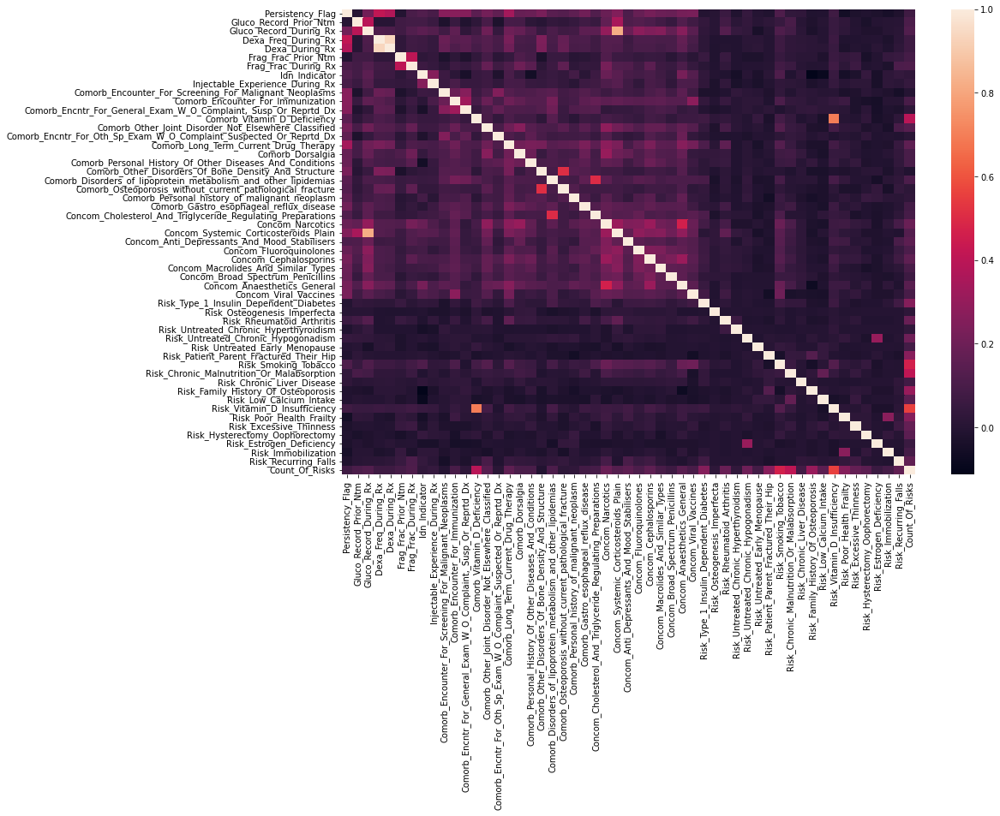

In [45]:
#Heatmap to find the correlation between features 
plt.subplots(figsize=(15,10))
sns.heatmap(df.corr())

In [46]:
# Creation of Dummy values

X=df.drop(['Persistency_Flag'],axis=1)
y=df['Persistency_Flag']

X = pd.get_dummies(X)
X.columns=[x.lower() for x in X.columns]
X_train,X_test,y_train,y_test=train_test_split(X,y,random_state=42,test_size=0.3, stratify=y)

In [47]:
df_train = X_train.copy()
df_train['Persistency_Flag'] = y_train
df_train.head()

,gluco_record_prior_ntm,gluco_record_during_rx,dexa_freq_during_rx,dexa_during_rx,frag_frac_prior_ntm,frag_frac_during_rx,idn_indicator,injectable_experience_during_rx,comorb_encounter_for_screening_for_malignant_neoplasms,comorb_encounter_for_immunization,"comorb_encntr_for_general_exam_w_o_complaint,_susp_or_reprtd_dx",comorb_vitamin_d_deficiency,comorb_other_joint_disorder_not_elsewhere_classified,comorb_encntr_for_oth_sp_exam_w_o_complaint_suspected_or_reprtd_dx,comorb_long_term_current_drug_therapy,comorb_dorsalgia,comorb_personal_history_of_other_diseases_and_conditions,comorb_other_disorders_of_bone_density_and_structure,comorb_disorders_of_lipoprotein_metabolism_and_other_lipidemias,comorb_osteoporosis_without_current_pathological_fracture,comorb_personal_history_of_malignant_neoplasm,comorb_gastro_esophageal_reflux_disease,concom_cholesterol_and_triglyceride_regulating_preparations,concom_narcotics,concom_systemic_corticosteroids_plain,concom_anti_depressants_and_mood_stabilisers,concom_fluoroquinolones,concom_cephalosporins,concom_macrolides_and_similar_types,concom_broad_spectrum_penicillins,concom_anaesthetics_general,concom_viral_vaccines,risk_type_1_insulin_dependent_diabetes,risk_osteogenesis_imperfecta,risk_rheumatoid_arthritis,risk_untreated_chronic_hyperthyroidism,risk_untreated_chronic_hypogonadism,risk_untreated_early_menopause,risk_patient_parent_fractured_their_hip,risk_smoking_tobacco,risk_chronic_malnutrition_or_malabsorption,risk_chronic_liver_disease,risk_family_history_of_osteoporosis,risk_low_calcium_intake,risk_vitamin_d_insufficiency,risk_poor_health_frailty,risk_excessive_thinness,risk_hysterectomy_oophorectomy,risk_estrogen_deficiency,risk_immobilization,risk_recurring_falls,count_of_risks,gender_female,gender_male,race_african american,race_asian,race_caucasian,race_other/unknown,ethnicity_hispanic,ethnicity_not hispanic,ethnicity_unknown,region_midwest,region_northeast,region_other/unknown,region_south,region_west,age_bucket_55-65,age_bucket_65-75,age_bucket_<55,age_bucket_>75,ntm_speciality_cardiology,ntm_speciality_clinical nurse specialist,ntm_speciality_emergency medicine,ntm_speciality_endocrinology,ntm_speciality_gastroenterology,ntm_speciality_general practitioner,ntm_speciality_geriatric medicine,ntm_speciality_hematology & oncology,ntm_speciality_hospice and palliative medicine,ntm_speciality_hospital medicine,ntm_speciality_nephrology,ntm_speciality_nuclear medicine,ntm_speciality_obstetrics & obstetrics & gynecology & obstetrics & gynecology,ntm_speciality_obstetrics and gynecology,ntm_speciality_occupational medicine,ntm_speciality_oncology,ntm_speciality_ophthalmology,ntm_speciality_orthopedic surgery,ntm_speciality_orthopedics,ntm_speciality_otolaryngology,ntm_speciality_pain medicine,ntm_speciality_pathology,ntm_speciality_pediatrics,ntm_speciality_physical medicine and rehabilitation,ntm_speciality_plastic surgery,ntm_speciality_podiatry,ntm_speciality_psychiatry and neurology,ntm_speciality_pulmonary medicine,ntm_speciality_radiology,ntm_speciality_rheumatology,ntm_speciality_surgery and surgical specialties,ntm_speciality_transplant surgery,ntm_speciality_urology,ntm_speciality_unknown,ntm_speciality_vascular surgery,ntm_specialist_flag_others,ntm_specialist_flag_specialist,ntm_speciality_bucket_endo/onc/uro,ntm_speciality_bucket_ob/gyn/others/pcp/unknown,ntm_speciality_bucket_rheum,risk_segment_prior_ntm_hr_vhr,risk_segment_prior_ntm_vlr_lr,tscore_bucket_prior_ntm_<=-2.5,tscore_bucket_prior_ntm_>-2.5,risk_segment_during_rx_hr_vhr,risk_segment_during_rx_unknown,risk_segment_during_rx_vlr_lr,tscore_bucket_during_rx_<=-2.5,tscore_bucket_during_rx_>-2.5,tscore_bucket_during_rx_unknown,change_t_score_improved,change_t_score_no change,change_t_score_unknown,change_t_score_worsened,change_risk_segment_improved,change_risk_segment_no change,change_risk_segment_unknown,change_risk_segment_worsened,adherent_flag_adherent,adherent_flag_non-adherent,Persistency_Flag
1493,1,1,0.0,0,0,0,0

In [48]:
classes=df_train['Persistency_Flag'].value_counts()
normal_share=round(classes[0]/df_train['Persistency_Flag'].count()*100,2)
fraud_share=round(classes[1]/df_train['Persistency_Flag'].count()*100, 2)
print("Non-Persistent : {} %".format(normal_share))
print("Persistent : {} %".format(fraud_share))

Non-Persistent : 69.6 %
Persistent : 30.4 %


In [49]:
fig = px.histogram(df_train, x="Persistency_Flag", color="Persistency_Flag", title="Persistent class histogram")
fig.show()

In [50]:
#To counter this unbalancing issue, Up Sampling method is used.
df_minority_upsampled = resample(df_train[df_train['Persistency_Flag'] == 1], 
                                 replace=True,     # sample with replacement
                                 n_samples=len(df_train[df_train['Persistency_Flag'] == 0]),    # to match majority class
                                 random_state=123) # reproducible results
 
# In this step, majority class is combined with minority class of unsampled
df_train = pd.concat([df_train[df_train['Persistency_Flag'] == 0], df_minority_upsampled])
df_train.Persistency_Flag.value_counts()

0    1433
1    1433
Name: Persistency_Flag, dtype: int64

In [51]:
X_train=df_train.drop(['Persistency_Flag'],axis=1)
y_train=df_train['Persistency_Flag']

In [52]:
fig = px.histogram(df_train, x="Persistency_Flag", color="Persistency_Flag", title="Persistent class histogram")
fig.show()

# Model Training 

In [53]:
target_names=['Non-Persistent', 'Persistent']

#### To evaluate the performance of classifier models that will be used, there are various metrices that can be used.
#### For this project, the following evalution techniques will be used:

- Accuracy
-Recall
-Precision
-F1 Score
-ROC
-AUC
-Confusion Matrix

In [54]:
#The following function will allow each of the classifier to be evaluated by the metrices mentioned above.

def evaluation_metrics(y_test, y_pre, target_names):
    #scores
    print("Accuracy :",accuracy_score(y_test,y_pre))
    print("Precision :",precision_score(y_test,y_pre))
    print("Recall :",recall_score(y_test,y_pre))
    print("F1 Score :",f1_score(y_test,y_pre))
    
    #This will print out the whole classification report with all the metrices. 
    print(classification_report(y_test, y_pre, target_names=target_names))

    #AUC- is scale-invariant. It measures how well predictions are ranked
    fpr, tpr, _ = roc_curve(y_test,  y_pre)
    auc = roc_auc_score(y_test, y_pre)
    print("AUC :", auc)

    #ROC-  depicts the rate of true positives with respect to the rate of false positives
    plt.plot(fpr,tpr,label="uc={:.3f})".format(auc))
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title('ROC curve')
    plt.legend(loc=4)
    plt.show()

    #Confusion Matrix
    matrix = confusion_matrix(y_test, y_pre)
    cm = pd.DataFrame(matrix, index=target_names, columns=target_names)
    
    #This will visualize the confusion matrix in a heatmap figure
    sns.heatmap(cm, annot=True, cbar=None, cmap="Blues", fmt = 'g')
    plt.title("Confusion Matrix"), plt.tight_layout()
    plt.ylabel("True Class"), plt.xlabel("Predicted Class")
    plt.show()

## Ensemble & Boosting Models

#### Models that will be tested:
- Bagging Classifier
- Gradient Boosting Classifier
- Random Forest Classifier
- ExtraTrees Classifier
- AdaBoost Classifier
- XGBoost Classifier
- Stacking Classifier


Accuracy : 0.7950169875424689
Precision : 0.6654135338345865
Recall : 0.6579925650557621
F1 Score : 0.6616822429906541
                precision    recall  f1-score   support

Non-Persistent       0.85      0.86      0.85       614
    Persistent       0.67      0.66      0.66       269

      accuracy                           0.80       883
     macro avg       0.76      0.76      0.76       883
  weighted avg       0.79      0.80      0.79       883

AUC : 0.7565207124953077


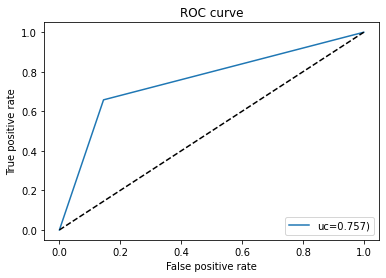

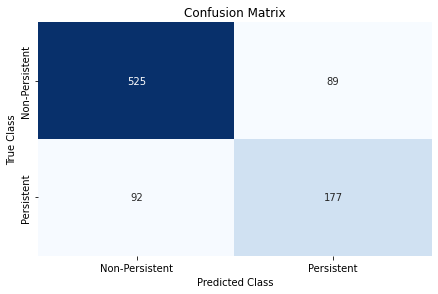

In [55]:
#Bagging Classifier

def Bagging(X_train,X_test,y_train,y_test):
  #train the model
  model = BaggingClassifier(base_estimator=SVC(), n_estimators=10, random_state=0)
  model.fit(X_train, y_train)
  #predictions
  y_pre = model.predict(X_test)
  evaluation_metrics(y_test, y_pre, target_names)

Bagging(X_train,X_test,y_train,y_test)

Accuracy : 0.7372593431483578
Precision : 0.5719844357976653
Recall : 0.5464684014869888
F1 Score : 0.5589353612167302
                precision    recall  f1-score   support

Non-Persistent       0.81      0.82      0.81       614
    Persistent       0.57      0.55      0.56       269

      accuracy                           0.74       883
     macro avg       0.69      0.68      0.69       883
  weighted avg       0.73      0.74      0.74       883

AUC : 0.6836576535122242


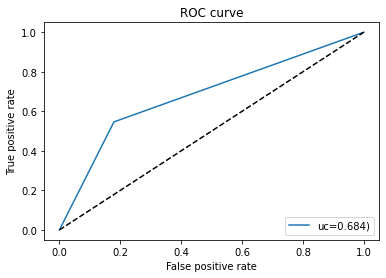

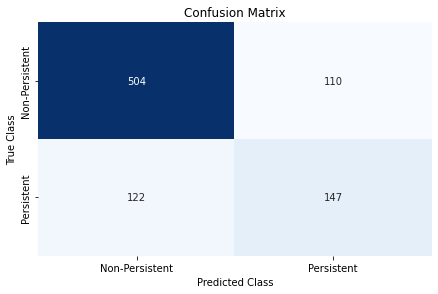

In [56]:
#Gradient Boosting Classifier

def GradientBoosting(X_train,X_test,y_train,y_test):
  #train the model
  model = GradientBoostingClassifier(n_estimators = 600, max_depth = 20, min_samples_split = 4,learning_rate = 0.01, criterion='mse')
  model.fit(X_train, y_train)
  #predictions
  y_pre = model.predict(X_test)
  evaluation_metrics(y_test, y_pre, target_names)

GradientBoosting(X_train,X_test,y_train,y_test)

Accuracy : 0.7893544733861835
Precision : 0.7128205128205128
Recall : 0.516728624535316
F1 Score : 0.5991379310344827
                precision    recall  f1-score   support

Non-Persistent       0.81      0.91      0.86       614
    Persistent       0.71      0.52      0.60       269

      accuracy                           0.79       883
     macro avg       0.76      0.71      0.73       883
  weighted avg       0.78      0.79      0.78       883

AUC : 0.7127617064044658


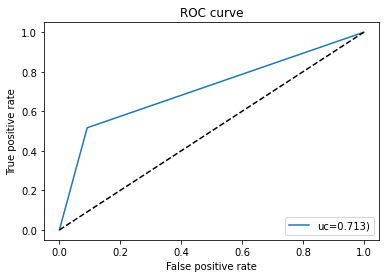

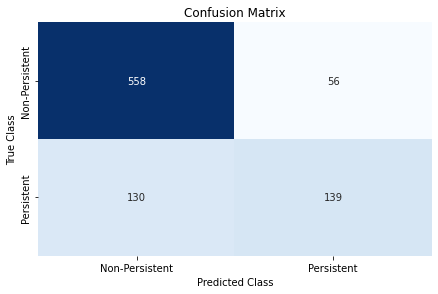

In [57]:
# Random Forest Classifier

def RF(X_train,X_test,y_train,y_test):
  #train the model
  model = RandomForestClassifier(random_state=2)
  model.fit(X_train, y_train)
  #predictions
  y_pre = model.predict(X_test)
  evaluation_metrics(y_test, y_pre, target_names)

RF(X_train,X_test,y_train,y_test)

Accuracy : 0.7882219705549264
Precision : 0.7887323943661971
Recall : 0.4163568773234201
F1 Score : 0.5450121654501217
                precision    recall  f1-score   support

Non-Persistent       0.79      0.95      0.86       614
    Persistent       0.79      0.42      0.55       269

      accuracy                           0.79       883
     macro avg       0.79      0.68      0.70       883
  weighted avg       0.79      0.79      0.77       883

AUC : 0.6837484712349999


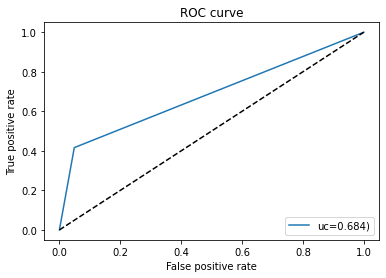

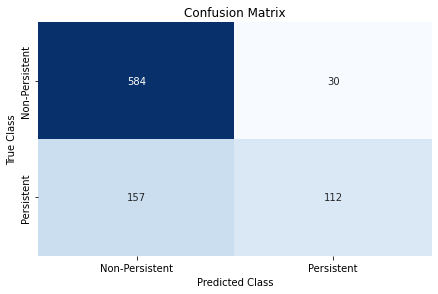

In [58]:
#ExtraTrees Classifier

def ExtraTrees(X_train,X_test,y_train,y_test):
  #train the model
  model = ExtraTreesClassifier(n_estimators=100, random_state=0)
  model.fit(X_train, y_train)
  #predictions
  y_pre = model.predict(X_test)
  evaluation_metrics(y_test, y_pre, target_names)

ExtraTrees(X_train,X_test,y_train,y_test)

Accuracy : 0.7802944507361268
Precision : 0.6237623762376238
Recall : 0.7026022304832714
F1 Score : 0.6608391608391608
                precision    recall  f1-score   support

Non-Persistent       0.86      0.81      0.84       614
    Persistent       0.62      0.70      0.66       269

      accuracy                           0.78       883
     macro avg       0.74      0.76      0.75       883
  weighted avg       0.79      0.78      0.78       883

AUC : 0.7584672390201372


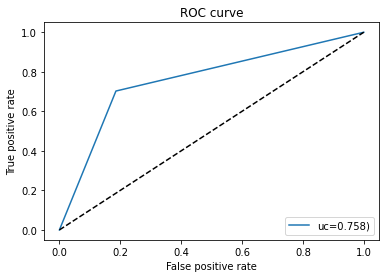

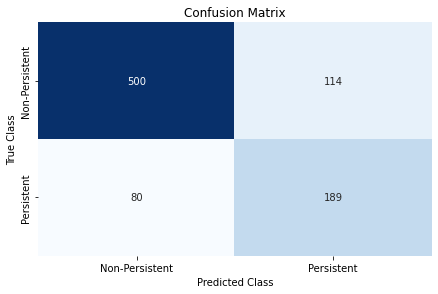

In [59]:
#AdaBoost Classifier

def AdaBoost(X_train,X_test,y_train,y_test):
  #train the model
  model = AdaBoostClassifier(n_estimators=100, random_state=0)
  model.fit(X_train, y_train)
  #predictions
  y_pre = model.predict(X_test)
  evaluation_metrics(y_test, y_pre, target_names)

AdaBoost(X_train,X_test,y_train,y_test)

Accuracy : 0.7734994337485843
Precision : 0.648068669527897
Recall : 0.5613382899628253
F1 Score : 0.601593625498008
                precision    recall  f1-score   support

Non-Persistent       0.82      0.87      0.84       614
    Persistent       0.65      0.56      0.60       269

      accuracy                           0.77       883
     macro avg       0.73      0.71      0.72       883
  weighted avg       0.77      0.77      0.77       883

AUC : 0.7138939006817384


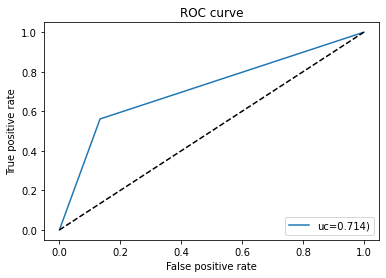

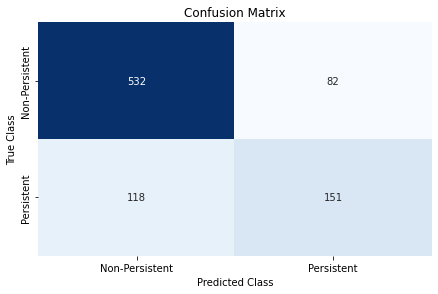

In [60]:
#XGBOOST Classifier

def XGBOOST(X_train,X_test,y_train,y_test):
  #train the model
  model = XGBClassifier(random_state=2)
  model.fit(X_train, y_train)
  #predictions
  y_pre = model.predict(X_test)
  evaluation_metrics(y_test, y_pre, target_names)

XGBOOST(X_train.values,X_test.values,y_train,y_test)

Accuracy : 0.8029445073612684
Precision : 0.7624309392265194
Recall : 0.5130111524163569
F1 Score : 0.6133333333333333
                precision    recall  f1-score   support

Non-Persistent       0.81      0.93      0.87       614
    Persistent       0.76      0.51      0.61       269

      accuracy                           0.80       883
     macro avg       0.79      0.72      0.74       883
  weighted avg       0.80      0.80      0.79       883

AUC : 0.7214892895632273


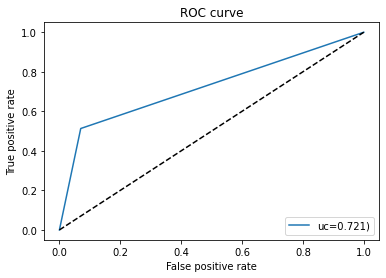

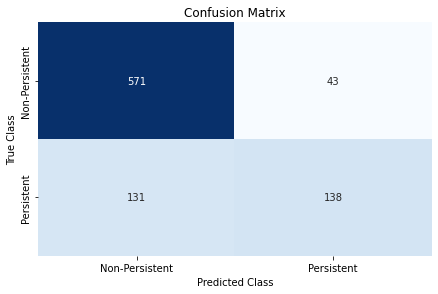

In [61]:
#Stacking Classifier

def Stacking(X_train,X_test,y_train,y_test):
  #train the model
  estimators = [('rf', RandomForestClassifier(n_estimators=10, random_state=42)), ('svr', make_pipeline(StandardScaler(), LinearSVC(random_state=42)))]
  model = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression())
  model.fit(X_train, y_train)
  #predictions
  y_pre = model.predict(X_test)
  evaluation_metrics(y_test, y_pre, target_names)

Stacking(X_train,X_test,y_train,y_test)

## Linear Models

#### Models that will be tested:
- Ridge Classifier
- SGD Classifier
- Logistic Regression Classifier


Accuracy : 0.7780294450736127
Precision : 0.6327272727272727
Recall : 0.6468401486988847
F1 Score : 0.6397058823529411
                precision    recall  f1-score   support

Non-Persistent       0.84      0.84      0.84       614
    Persistent       0.63      0.65      0.64       269

      accuracy                           0.78       883
     macro avg       0.74      0.74      0.74       883
  weighted avg       0.78      0.78      0.78       883

AUC : 0.7411725173461852


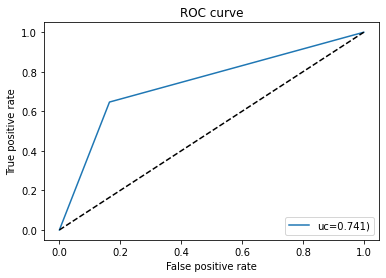

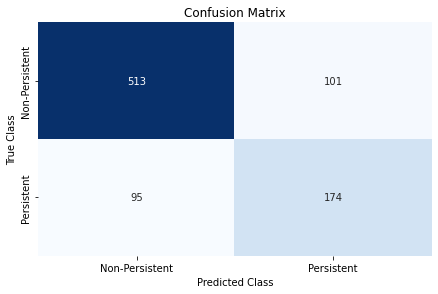

In [62]:
#Ridge Classifier 

def Ridge(X_train,X_test,y_train,y_test):
    #train the model
    model = RidgeClassifier(random_state=2)
    model.fit(X_train, y_train)
    #predictions
    y_pre = model.predict(X_test)
    evaluation_metrics(y_test, y_pre, target_names)

Ridge(X_train,X_test,y_train,y_test)

Accuracy : 0.7814269535673839
Precision : 0.6233766233766234
Recall : 0.7137546468401487
F1 Score : 0.6655112651646448
                precision    recall  f1-score   support

Non-Persistent       0.87      0.81      0.84       614
    Persistent       0.62      0.71      0.67       269

      accuracy                           0.78       883
     macro avg       0.74      0.76      0.75       883
  weighted avg       0.79      0.78      0.79       883

AUC : 0.762414782703462


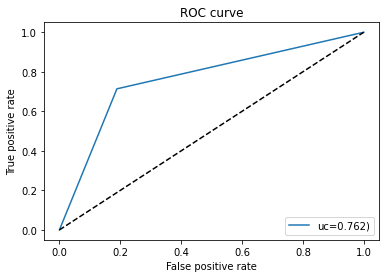

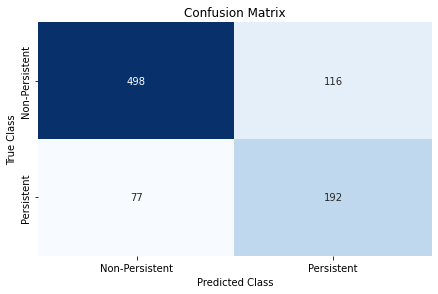

In [63]:
#SGD Classifier

def SGD(X_train,X_test,y_train,y_test):
    #train the model
    model = SGDClassifier()
    model.fit(X_train, y_train)
    #predictions
    y_pre = model.predict(X_test)
    evaluation_metrics(y_test, y_pre, target_names)

SGD(X_train,X_test,y_train,y_test)

Accuracy : 0.7814269535673839
Precision : 0.6283783783783784
Recall : 0.6914498141263941
F1 Score : 0.6584070796460177
                precision    recall  f1-score   support

Non-Persistent       0.86      0.82      0.84       614
    Persistent       0.63      0.69      0.66       269

      accuracy                           0.78       883
     macro avg       0.74      0.76      0.75       883
  weighted avg       0.79      0.78      0.78       883

AUC : 0.7561483598319267


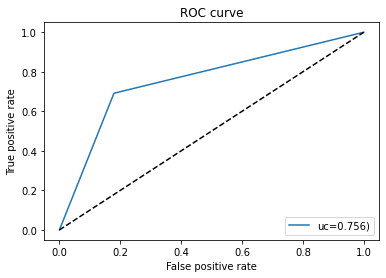

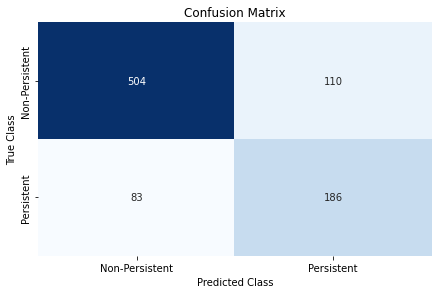

In [64]:
# Logistic Regression Classifier

def logistic(X_train,X_test,y_train,y_test):
    model=LogisticRegression()
    model.fit(X_train,y_train)
    y_pre=model.predict(X_test)
    evaluation_metrics(y_test, y_pre, target_names)

logistic(X_train,X_test,y_train,y_test)

## Neural Network

#### Models that will be tested:
- Multi-Layer Neural Network
- Multi-Layer Perceptron


Epoch 1/150
230/230 [==============================] - 0s 2ms/step - loss: 0.6956 - accuracy: 0.5065 - val_loss: 0.7162 - val_accuracy: 0.1916
Epoch 2/150
230/230 [==============================] - 0s 1ms/step - loss: 0.6883 - accuracy: 0.5432 - val_loss: 0.7423 - val_accuracy: 0.0801
Epoch 3/150
230/230 [==============================] - 0s 1ms/step - loss: 0.6866 - accuracy: 0.5593 - val_loss: 0.7557 - val_accuracy: 0.0366
Epoch 4/150
230/230 [==============================] - 0s 1ms/step - loss: 0.6722 - accuracy: 0.6091 - val_loss: 0.7783 - val_accuracy: 0.0331
Epoch 5/150
230/230 [==============================] - 0s 1ms/step - loss: 0.6688 - accuracy: 0.6025 - val_loss: 0.7891 - val_accuracy: 0.0279
Epoch 6/150
230/230 [==============================] - 0s 1ms/step - loss: 0.6555 - accuracy: 0.6034 - val_loss: 0.8146 - val_accuracy: 0.0261
Epoch 7/150
230/230 [==============================] - 0s 1ms/step - loss: 0.6526 - accuracy: 0.6091 - val_loss: 0.8344 - val_accuracy: 0.0226

Epoch 58/150
230/230 [==============================] - 0s 1ms/step - loss: 0.4242 - accuracy: 0.8294 - val_loss: 0.6076 - val_accuracy: 0.7317
Epoch 59/150
230/230 [==============================] - 0s 1ms/step - loss: 0.4170 - accuracy: 0.8233 - val_loss: 0.6021 - val_accuracy: 0.7300
Epoch 60/150
230/230 [==============================] - 0s 1ms/step - loss: 0.4049 - accuracy: 0.8355 - val_loss: 0.5940 - val_accuracy: 0.7317
Epoch 61/150
230/230 [==============================] - 0s 1ms/step - loss: 0.4246 - accuracy: 0.8237 - val_loss: 0.5895 - val_accuracy: 0.7317
Epoch 62/150
230/230 [==============================] - 0s 1ms/step - loss: 0.4210 - accuracy: 0.8259 - val_loss: 0.5963 - val_accuracy: 0.7369
Epoch 63/150
230/230 [==============================] - 0s 1ms/step - loss: 0.4144 - accuracy: 0.8242 - val_loss: 0.6064 - val_accuracy: 0.7387
Epoch 64/150
230/230 [==============================] - 0s 1ms/step - loss: 0.4092 - accuracy: 0.8285 - val_loss: 0.5908 - val_accuracy:

Epoch 115/150
230/230 [==============================] - 0s 1ms/step - loss: 0.3066 - accuracy: 0.8700 - val_loss: 0.5152 - val_accuracy: 0.8258
Epoch 116/150
230/230 [==============================] - 0s 1ms/step - loss: 0.3096 - accuracy: 0.8831 - val_loss: 0.5168 - val_accuracy: 0.8310
Epoch 117/150
230/230 [==============================] - 0s 1ms/step - loss: 0.3045 - accuracy: 0.8805 - val_loss: 0.5150 - val_accuracy: 0.8223
Epoch 118/150
230/230 [==============================] - 0s 1ms/step - loss: 0.3011 - accuracy: 0.8800 - val_loss: 0.5266 - val_accuracy: 0.8118
Epoch 119/150
230/230 [==============================] - 0s 1ms/step - loss: 0.3115 - accuracy: 0.8695 - val_loss: 0.5024 - val_accuracy: 0.8258
Epoch 120/150
230/230 [==============================] - 0s 1ms/step - loss: 0.3196 - accuracy: 0.8735 - val_loss: 0.5148 - val_accuracy: 0.8223
Epoch 121/150
230/230 [==============================] - 0s 1ms/step - loss: 0.3036 - accuracy: 0.8839 - val_loss: 0.4819 - val_ac

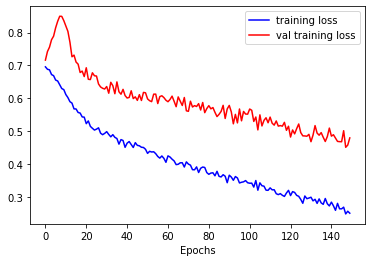

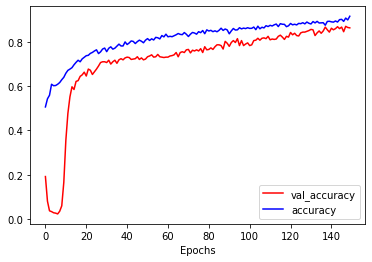

Instructions for updating:
Please use instead:* `np.argmax(model.predict(x), axis=-1)`,   if your model does multi-class classification   (e.g. if it uses a `softmax` last-layer activation).* `(model.predict(x) > 0.5).astype("int32")`,   if your model does binary classification   (e.g. if it uses a `sigmoid` last-layer activation).
Accuracy : 0.7893544733861835
Precision : 0.6844444444444444
Recall : 0.5724907063197026
F1 Score : 0.6234817813765182
                precision    recall  f1-score   support

Non-Persistent       0.83      0.88      0.85       614
    Persistent       0.68      0.57      0.62       269

      accuracy                           0.79       883
     macro avg       0.75      0.73      0.74       883
  weighted avg       0.78      0.79      0.78       883

AUC : 0.728427763583304


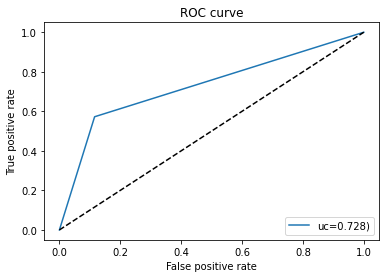

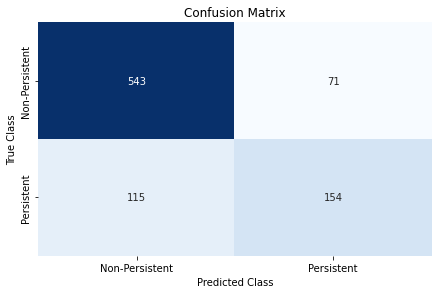

In [65]:
#Multilayer Neural Network 

def MNN(X_train,X_test,y_train,y_test):
  #train the model
  model = Sequential()
  model.add(Dense(32, input_shape=(X_train.shape[1],), activation='relu')),
  model.add(Dropout(0.2)),
  model.add(Dense(16, activation='relu')),
  model.add(Dropout(0.2)),
  model.add(Dense(8, activation='relu')),
  model.add(Dropout(0.2)),
  model.add(Dense(4, activation='relu')),
  model.add(Dropout(0.2)),
  model.add(Dense(1, activation='sigmoid'))

  opt = tf.keras.optimizers.Adam(learning_rate=0.0001) #optimizer

  model.compile(optimizer=opt, loss=tf.keras.losses.BinaryCrossentropy(), metrics=['accuracy']) #metrics

  earlystopper = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', min_delta=0, patience=15, verbose=1, mode='auto', baseline=None, restore_best_weights=False)

  history = model.fit(X_train.values, y_train.values, epochs = 150, batch_size=10, validation_split = 0.20, verbose = 1, callbacks = [earlystopper])
  history_dict = history.history

  loss_values = history_dict['loss']
  val_loss_values=history_dict['val_loss']
  plt.plot(loss_values,'b',label='training loss')
  plt.plot(val_loss_values,'r',label='val training loss')
  plt.legend()
  plt.xlabel("Epochs")
  plt.show()  

  accuracy_values = history_dict['accuracy']
  val_accuracy_values=history_dict['val_accuracy']
  plt.plot(val_accuracy_values,'-r',label='val_accuracy')
  plt.plot(accuracy_values,'-b',label='accuracy')
  plt.legend()
  plt.xlabel("Epochs")
  plt.show()

  #predictions
  y_pre = model.predict_classes(X_test)

  evaluation_metrics(y_test, y_pre, target_names)

MNN(X_train,X_test,y_train,y_test)

Accuracy : 0.7587768969422424
Precision : 0.6129032258064516
Recall : 0.5650557620817844
F1 Score : 0.5880077369439072
                precision    recall  f1-score   support

Non-Persistent       0.82      0.84      0.83       614
    Persistent       0.61      0.57      0.59       269

      accuracy                           0.76       883
     macro avg       0.71      0.70      0.71       883
  weighted avg       0.75      0.76      0.76       883

AUC : 0.70435198527542


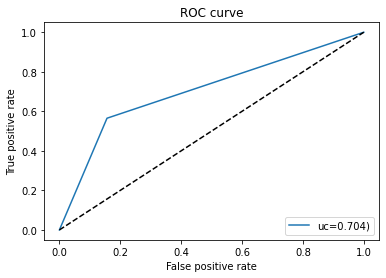

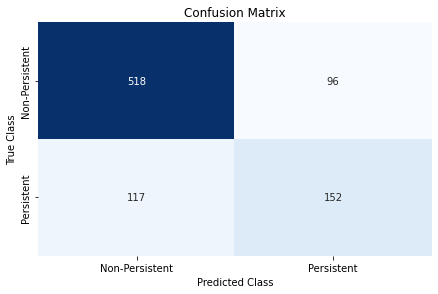

In [66]:
#Multi-Layer Perceptron

def MLP(X_train,X_test,y_train,y_test):
  #train the model
  mlp = MLPClassifier(solver='lbfgs', hidden_layer_sizes=(100,100), random_state=2)
  mlp.fit(X_train, y_train)
  mlp.get_params(deep=True)
  #predictions
  y_pre = mlp.predict(X_test)
  evaluation_metrics(y_test, y_pre, target_names)

MLP(X_train,X_test,y_train,y_test)

## Final Recommendation & Conclusion

| Classifier | Accuracy |
| :- | :-: |
| StackingClassifier | 0.80
| BaggingClassifier | 0.80
| RidgeClassifier | 0.79

By taking into consideration all the above mentioned metrices, it can be seen that Stacking Classifier gives our the best performance and a slightly better result than Ridge Classifier and Bagging Classifier. 

## Chosen Model Training

In [67]:
# The model recommended above will now be trained.
# Pickle will be used

estimators = [('rf', RandomForestClassifier(n_estimators=10, random_state=42)), ('svr', make_pipeline(StandardScaler(), LinearSVC(random_state=42)))]
chosen_model = StackingClassifier(estimators=estimators, final_estimator=LogisticRegression())
chosen_model.fit(X, y)
filename = 'recommended_model.sav'
pickle.dump(chosen_model, open(filename, 'wb'))